<a href="https://colab.research.google.com/github/PrateekBatham2004/Image-Stitching-to-form-a-seamless-Panorama/blob/main/Image_stitching_for_seamless_Panorama.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

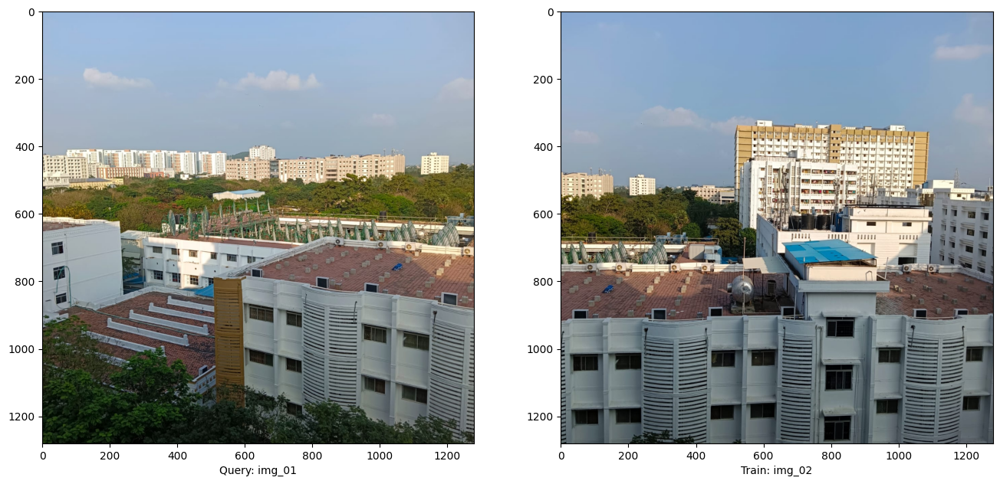

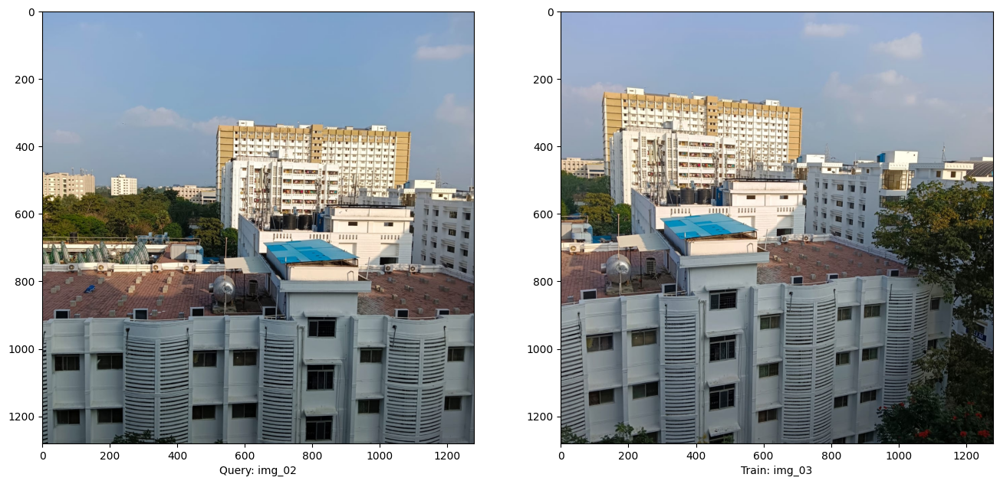

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

def load_and_prepare_images(query_path, train_path):
    query = cv2.imread(query_path)
    train = cv2.imread(train_path)

    if query is None:
        raise FileNotFoundError(f"Could not load query image: {query_path}")
    if train is None:
        raise FileNotFoundError(f"Could not load train image: {train_path}")

    query_rgb = cv2.cvtColor(query, cv2.COLOR_BGR2RGB)
    train_rgb = cv2.cvtColor(train, cv2.COLOR_BGR2RGB)

    return query_rgb, train_rgb

def plot_and_save(query_img, train_img, filename, query_label, train_label):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 9))
    ax1.imshow(query_img)
    ax1.set_xlabel(query_label)
    ax2.imshow(train_img)
    ax2.set_xlabel(train_label)
    plt.savefig(filename, bbox_inches='tight', dpi=300)
    plt.show()

query1, train1 = load_and_prepare_images('img_01.jpg', 'img_02.jpg')
plot_and_save(query1, train1, './output_pair1.jpg', "Query: img_01", "Train: img_02")

query2, train2 = load_and_prepare_images('img_02.jpg', 'img_03.jpg')
plot_and_save(query2, train2, './output_pair2.jpg', "Query: img_02", "Train: img_03")


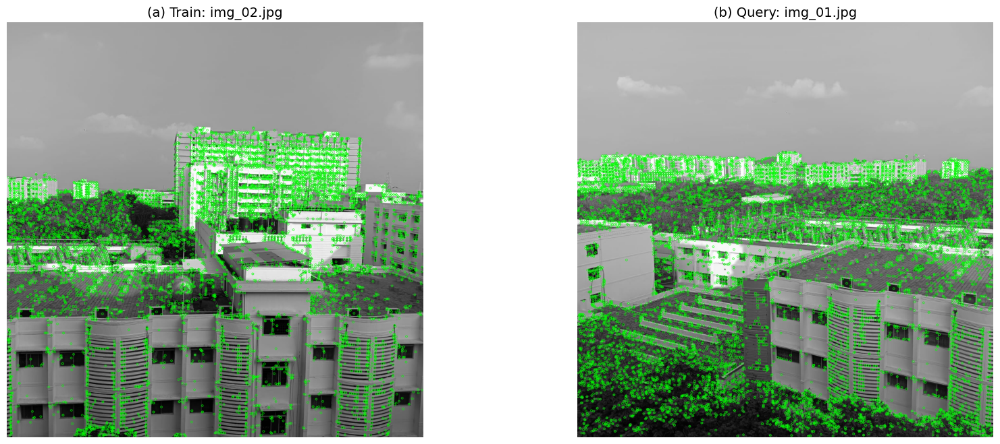


[pair1] Last keypoint (Query):
  • Position: (1277.20, 609.22)
  • Size: 1.9421672821044922
  • Angle: 272.1849060058594
  • Response: 0.014556447975337505
  • Octave: 5636607
  • Class ID: -1
  • Total keypoints in query image: 12581
  • Descriptor shape: (12581, 128)


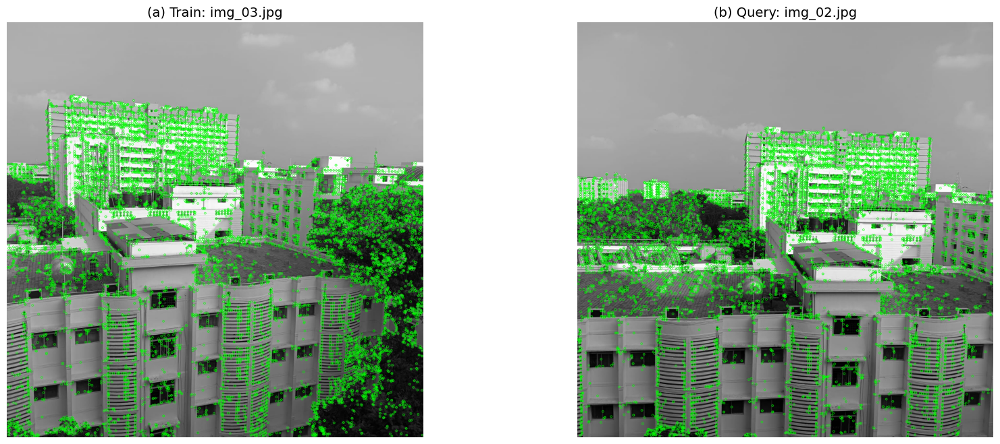


[pair2] Last keypoint (Query):
  • Position: (1275.51, 755.17)
  • Size: 2.3399593830108643
  • Angle: 273.6887512207031
  • Response: 0.019840404391288757
  • Octave: 2425599
  • Class ID: -1
  • Total keypoints in query image: 10173
  • Descriptor shape: (10173, 128)


In [ ]:
import os
import cv2
import matplotlib.pyplot as plt

# Ensure output directory exists
os.makedirs("./output", exist_ok=True)

# Initialize SIFT
sift = cv2.SIFT_create()

def load_gray_image(path):
    img = cv2.imread(path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
    return img_rgb, img_gray

def process_image_pair(query_path, train_path, pair_label):
    query_rgb, query_gray = load_gray_image(query_path)
    train_rgb, train_gray = load_gray_image(train_path)

    kp_train, des_train = sift.detectAndCompute(train_gray, None)
    kp_query, des_query = sift.detectAndCompute(query_gray, None)

    # Visualize keypoints on both images
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))
    ax1.imshow(cv2.drawKeypoints(train_gray, kp_train, None, color=(0, 255, 0)))
    ax1.set_title(f"(a) Train: {os.path.basename(train_path)}", fontsize=14)
    ax1.axis('off')

    ax2.imshow(cv2.drawKeypoints(query_gray, kp_query, None, color=(0, 255, 0)))
    ax2.set_title(f"(b) Query: {os.path.basename(query_path)}", fontsize=14)
    ax2.axis('off')

    plt.savefig(f"./output/sift_{pair_label}_features.jpeg", bbox_inches='tight', dpi=300)
    plt.show()

    # --- Print info about the last keypoint in query image ---
    if kp_query:
        last_kp = kp_query[-1]
        print(f"\n[{pair_label}] Last keypoint (Query):")
        print(f"  • Position: ({last_kp.pt[0]:.2f}, {last_kp.pt[1]:.2f})")
        print(f"  • Size: {last_kp.size}")
        print(f"  • Angle: {last_kp.angle}")
        print(f"  • Response: {last_kp.response}")
        print(f"  • Octave: {last_kp.octave}")
        print(f"  • Class ID: {last_kp.class_id}")
        print(f"  • Total keypoints in query image: {len(kp_query)}")
        if des_query is not None:
            print(f"  • Descriptor shape: {des_query.shape}")
    else:
        print(f"\n[{pair_label}] No keypoints found in query image.")

# Run the keypoint visualization and print info
process_image_pair("/content/img_01.jpg", "/content/img_02.jpg", "pair1")
process_image_pair("/content/img_02.jpg", "/content/img_03.jpg", "pair2")


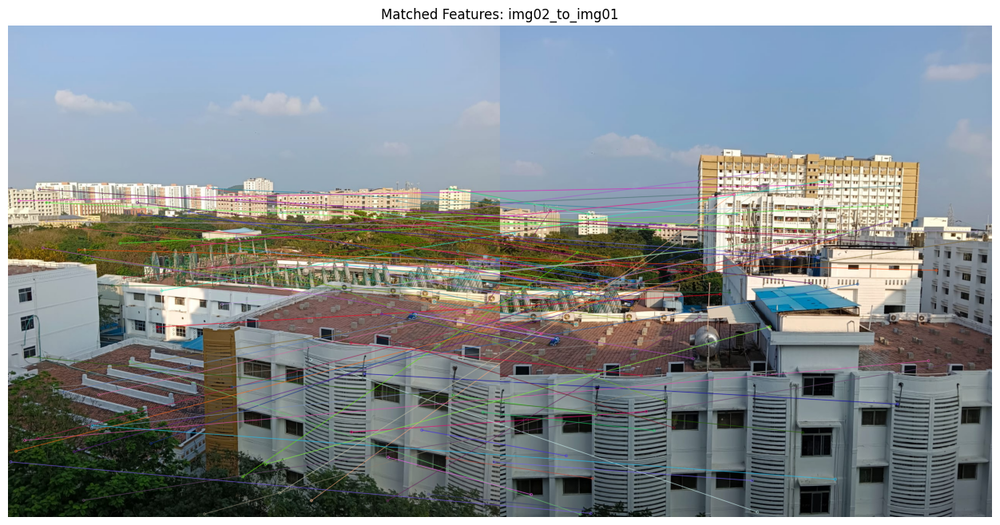

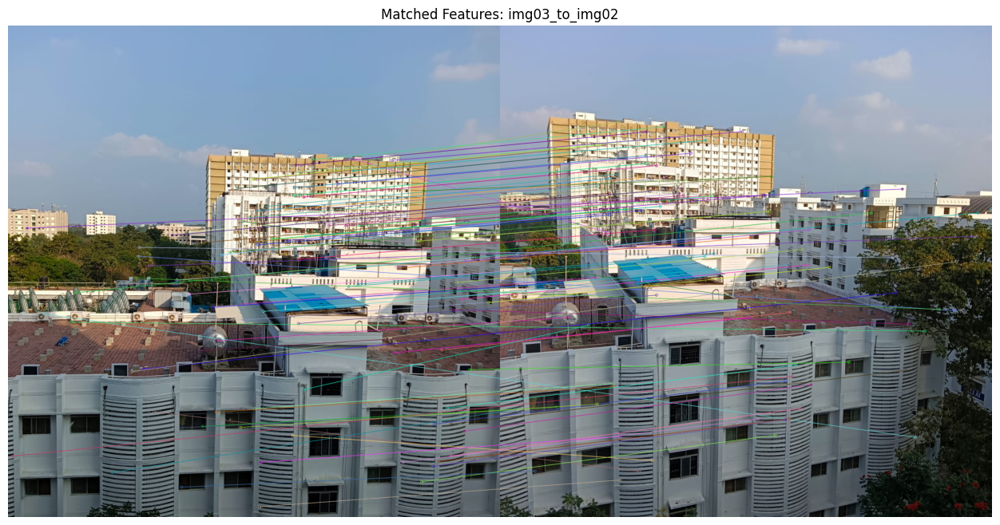

In [ ]:

# Matching function
def key_points_matching(des_train, des_query):
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
    matches = bf.match(des_train, des_query)
    return sorted(matches, key=lambda x: x.distance)

# Drawing function
def draw_and_save(imgA, kpA, imgB, kpB, matches, label, method="bf"):
    fig = plt.figure(figsize=(20, 8))
    sample_matches = random.sample(matches, min(100, len(matches)))
    matched_img = cv2.drawMatches(imgA, kpA, imgB, kpB, sample_matches, None,
                                  flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    plt.imshow(cv2.cvtColor(matched_img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title(f"Matched Features: {label}")
    plt.savefig(f"./output/{method}_matching_{label}.jpg", bbox_inches='tight', dpi=300)
    plt.show()

# Load images
img1 = cv2.imread("/content/img_01.jpg")
img2 = cv2.imread("/content/img_02.jpg")
img3 = cv2.imread("/content/img_03.jpg")

# Convert to grayscale
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
gray3 = cv2.cvtColor(img3, cv2.COLOR_BGR2GRAY)

# Detect keypoints and descriptors
sift = cv2.SIFT_create()
kp1, des1 = sift.detectAndCompute(gray1, None)
kp2, des2 = sift.detectAndCompute(gray2, None)
kp3, des3 = sift.detectAndCompute(gray3, None)

# Match img_02 → img_01
matches_2_1 = key_points_matching(des1, des2)
draw_and_save(img1, kp1, img2, kp2, matches_2_1, "img02_to_img01", "bf")

# Match img_03 → img_02
matches_3_2 = key_points_matching(des2, des3)
draw_and_save(img2, kp2, img3, kp3, matches_3_2, "img03_to_img02", "bf")


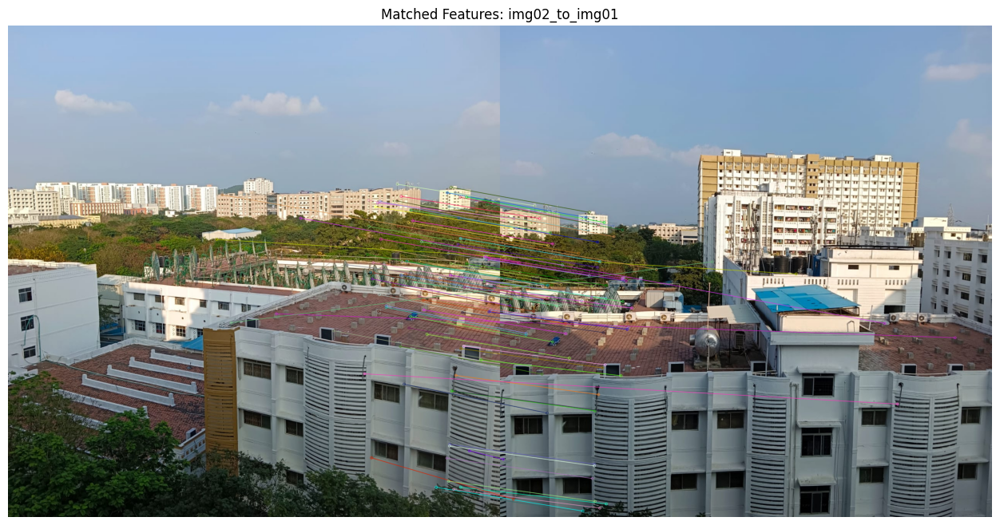

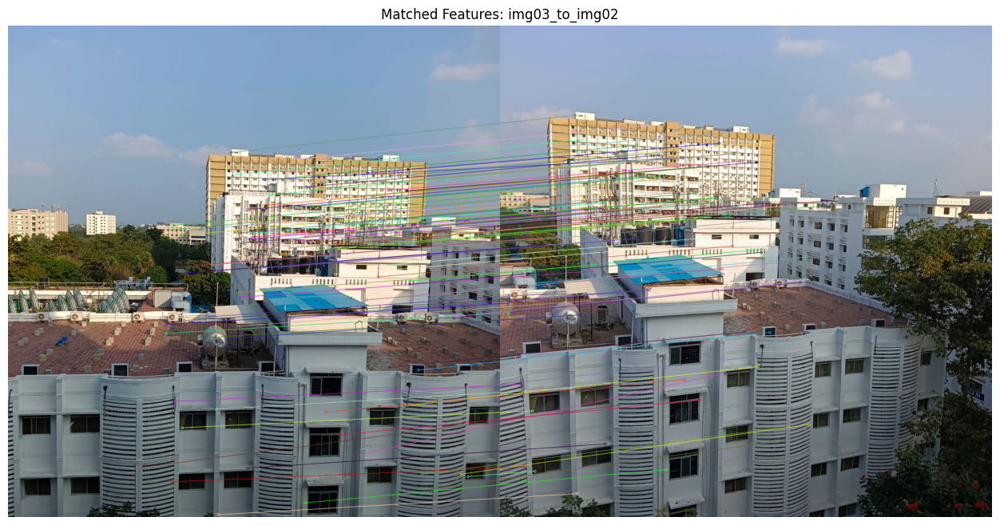

In [ ]:
def key_points_matching_KNN(des_train, des_query, ratio=0.75):
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)
    rawMatches = bf.knnMatch(des_train, des_query, k=2)
    good_matches = [m for m, n in rawMatches if m.distance < ratio * n.distance]
    return good_matches

# Match img_02 → img_01 using KNN
matches_knn_2_1 = key_points_matching_KNN(des1, des2)
draw_and_save(img1, kp1, img2, kp2, matches_knn_2_1, "img02_to_img01", "knn")

# Match img_03 → img_02 using KNN
matches_knn_3_2 = key_points_matching_KNN(des2, des3)
draw_and_save(img2, kp2, img3, kp3, matches_knn_3_2, "img03_to_img02", "knn")


Panorama created successfully!


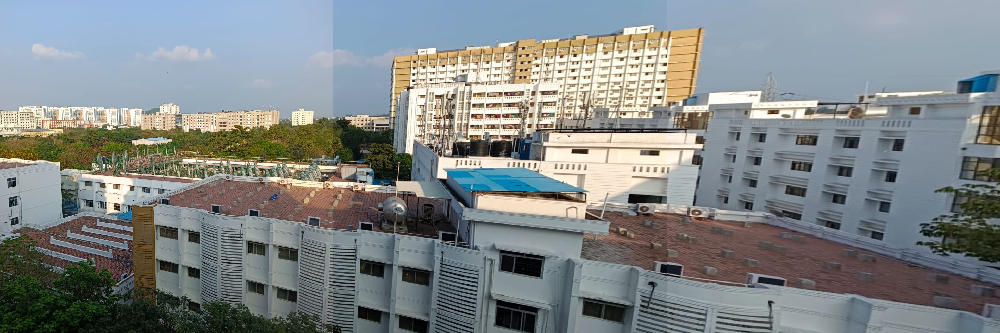

In [ ]:
from google.colab.patches import cv2_imshow

def stitch_images(base_img, new_img):
    kp1, des1 = sift.detectAndCompute(base_img, None)
    kp2, des2 = sift.detectAndCompute(new_img, None)

    flann = cv2.FlannBasedMatcher(dict(algorithm=1, trees=5), dict(checks=50))
    matches = flann.knnMatch(des1, des2, k=2)

    good = [m for m, n in matches if m.distance < 0.7 * n.distance]
    if len(good) < 4:
        print("Not enough matches!")
        return None

    src_pts = np.float32([kp1[m.queryIdx].pt for m in good]).reshape(-1,1,2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in good]).reshape(-1,1,2)
    H, _ = cv2.findHomography(dst_pts, src_pts, cv2.RANSAC, 4.0)

    height, width = base_img.shape[:2]
    panorama = cv2.warpPerspective(new_img, H, (width + new_img.shape[1], height))
    panorama[0:height, 0:width] = base_img
    return panorama

def stitch_all_images(image_files):
    images = [cv2.imread(img) for img in image_files]
    for i, img in enumerate(images):
        if img is None:
            print(f"Could not load {image_files[i]}")
            return None

    panorama = images[0]
    for i in range(1, len(images)):
        panorama = stitch_images(panorama, images[i])
        if panorama is None:
            print("Fallback: using OpenCV Stitcher...")
            return stitch_with_opencv(image_files)
    return panorama

def stitch_with_opencv(image_files):
    images = [cv2.imread(img) for img in image_files]
    stitcher = cv2.Stitcher_create()
    status, result = stitcher.stitch(images)
    return result if status == cv2.Stitcher_OK else None

image_files = ["/content/img_01.jpg", "/content/img_02.jpg", "/content/img_03.jpg"]
panorama = stitch_all_images(image_files)

if panorama is not None:
    print("Panorama created successfully!")
    cv2_imshow(panorama)
else:
    print("Panorama stitching failed.")
